In [1]:
!pip install opencv-python>=4.1.1
#!pip install numpy==1.23.1
!pip install Pillow>=7.1.2
!pip install scikit-image==0.19.3
!pip install timm==0.9.12
!pip3 install mega.py
!pip install git+https://github.com/ChaoningZhang/MobileSAM.git
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 15.3 MB/s eta 0:00:00
  Attempting uninstall: tenacity
    Found existing installation: tenacity 8.2.3
    Uninstalling tenacity-8.2.3:
      Successfully uninstalled tenacity-8.2.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotly 5.15.0 requires tenacity>=6.2.0, but you have tenacity 5.1.5 which is incompatible.
  Cloning https://github.com/ChaoningZhang/MobileSAM.git to /tmp/pip-req-build-ys_t3sam
  Running command git clone --filter=blob:none --quiet https://github.com/ChaoningZhang/MobileSAM.git /tmp/pip-req-build-ys_t3sam
  Resolved https://github.com/ChaoningZhang/MobileSAM.git to commit c12dd83cbe26dffdcc6a0f9e7be2f6fb024df0ed
  Preparing metadata (setup.py) ... done
  Created wheel for mobile-sam: filename=mobile_

Clone the repository

In [2]:
!git clone https://github.com/licksylick/AutoTrackAnything.git

Cloning into 'AutoTrackAnything'...
remote: Enumerating objects: 164, done.
remote: Counting objects: 100% (39/39), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 164 (delta 20), reused 9 (delta 2), pack-reused 125
Receiving objects: 100% (164/164), 96.51 MiB | 22.24 MiB/s, done.
Resolving deltas: 100% (26/26), done.


Now we need to download models: xMem and mobile-sam

In [3]:
%cd AutoTrackAnything
!python download_models.py

/content/AutoTrackAnything
Success! Models have been downloaded to the "saves" folder


# Inference on video

Let download small video for test

In [4]:
from mega import Mega
import zipfile
import shutil
import os

mega = Mega()
m = mega.login()
m.download_url('https://mega.nz/file/QCBEVBBD#BpyOALj4UFnQavwFE0Td0IU88KZONghJzJ9dLKrNWZU')

print('Success! Video have been downloaded')

Success! Video have been downloaded


In [5]:
from IPython.display import HTML
from base64 import b64encode
data_url = "data:video/mp4;base64," + b64encode(open('test_football_video.mp4', 'rb').read()).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)



*   width, height - video resolution
*   frames_to_propagate - inference on N frames
*   output_video_path - your output video path (mp4)
*   device - if you has only cpu set cpu. If you has one gpu - set 0, if more gpus - set num of gpu which you want to use
*   person_conf - confidence for Yolov8 to detect persons or your custom classes
*   kpts_conf - confidence of keypoints of each NEW person in frame (you can choose used keypoints in pose_estimation.py in get_filtered_bboxes_by_confidence method). It's neccesary for adding only good visible persons.
*   iou_thresh - IOU between known (already tracked) persons and new persons (which will be add). If IOU < iou_thresh, so we add new person.
*   yolo_every - check if new person in frame every N frames.
*   output_path - output path to csv table with results.









In [7]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!python tracking.py --video_path=test_football_video.mp4 --width=1280 \
--height=768 --frames_to_propagate=600 --output_video_path=res.mp4 --device=0 \
--person_conf=0.6 --kpts_conf=0.4 --iou_thresh=0.15 --yolo_every=2 --output_path=tracking_results.csv

/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_11m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_21m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_21m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_

Check result video in AutoTrackAnything folder.

Look on our results (csv file):

In [8]:
import pandas as pd

df = pd.read_csv('tracking_results.csv')
df

,frame_id,person_id,x1,y1,x2,y2
0,0,1,80,303,191,502
1,0,2,600,326,801,680
2,0,3,935,326,1105,642
3,0,4,1202,326,1272,528
4,1,1,82,301,193,503
...,...,...,...,...,...,...
433,116,2,1102,347,1155,482
434,116,4,1090,383,1201,550
435,117,1,296,309,439,669
436,117,2,1118,348,1181,488


# Metrics counting on directory with frames (images)

Let download video (frames) and labels from CVAT. You can setup it on your computer and label your videos unlimit.  
  
![structure](https://i.ibb.co/pwdWXGV/image.png)  
![Example of data](https://i.ibb.co/JnRKfn3/2023-12-26-16-23-40.png)  


Labels: Yolo (from CVAT exporting)  
(directory with txt files corresponding to frames, format of example.txt:  

0 0.265682 0.430208 0.057479 0.279509  
1 0.483107 0.486296 0.069411 0.337759  
2 0.571393 0.430625 0.058245 0.280917  
3 0.233581 0.541968 0.084089 0.398139  
4 0.821490 0.466750 0.058260 0.333426  
5 0.743799 0.467407 0.060016 0.289593 )

You can load example of labeled video:

In [9]:
from mega import Mega
import zipfile
import shutil
import os

mega = Mega()
m = mega.login()
m.download_url('https://mega.nz/file/xGoRyZDR#DH9KFrGjqod-ERWXHJJEfcbWrDEgXuzqAJt5wzd35NY')
with zipfile.ZipFile('AutoTrackAnything_cvat_data.zip', 'r') as zip_ref:
    zip_ref.extractall('test_files')
os.remove('AutoTrackAnything_cvat_data.zip')
try:
  shutil.rmtree('test_files/__MACOSX')
except:
  pass

print('Success! Frames and labels have been downloaded')

Success! Frames and labels have been downloaded


In [10]:
%load_ext autoreload
%autoreload 2
import cv2
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from math import ceil
import os
import numpy as np
from tracker import Tracker
from PIL import Image
from inference.inference_utils import generate_colors_dict, add_new_classes_to_dict, merge_masks, get_iou_filtered_yolo_mask_bboxes, save_mask, masks_on_im, overlay_mask_on_image
from inference.interact.interactive_utils import image_to_torch, index_numpy_to_one_hot_torch, torch_prob_to_numpy_mask, overlay_davis

/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_11m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_21m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_21m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_

In [11]:
DEVICE = '0' # For GPU set device num which you want to use (or set 'cpu', but it's too slow)
#DEVICE = 'cpu'

# Our confidence for every person (bbox)
PERSON_CONF = 0.8

KEYPOINTS = ["nose", "left_eye", "right_eye", "left_ear", "right_ear", "left_shoulder", "right_shoulder", "left_elbow", "right_elbow", "left_wrist", "right_wrist", "left_hip", "right_hip", "left_knee", "right_knee", "left_ankle", "right_ankle"]

# Our confidence for used keypoints
KPTS_CONF = 0.8

IOU_THRESHOLD = 0.1

# It's xMem original config, you can try to change this values for your task (check xMem article)
XMEM_CONFIG = {
    'top_k': 30,
    'mem_every': 5,
    'deep_update_every': -1,
    'enable_long_term': True,
    'enable_long_term_count_usage': True,
    'num_prototypes': 512,
    'min_mid_term_frames': 7,
    'max_mid_term_frames': 20,
    'max_long_term_elements': 10000,
}

# Max possible count of persons in video (if you has error, set bigger number)
MAX_OBJECT_CNT = 10

# Check new persons in frame every N frames
YOLO_EVERY = 1

# Resize processed video. For better results you can increase resolution
INFERENCE_SIZE = (1280, 768)

In [12]:
TEST_DIR = 'test_files'

SHOW_EVERY = 9 #show every N image from all videos in cell

PRINT_LOGS = True # print gt bboxes, ids and pred bboxes. If you don't need, set False

FINAL_PRECISION = 0.
FINAL_RECALL = 0.
FINAL_F1_SCORE = 0.

precision_arr = []
recall_arr = []
f1_score_arr = []


Metrics calculates on each frame and then average

Hyperparameters read from the model weights: C^k=64, C^v=512, C^h=64
Single object mode: False
AutoTrackAnything_cvat_data
Hyperparameters read from the model weights: C^k=64, C^v=512, C^h=64
Single object mode: False

0: 384x640 4 persons, 269.1ms
Speed: 3.0ms preprocess, 269.1ms inference, 421.2ms postprocess per image at shape (1, 3, 384, 640)


/content/AutoTrackAnything/tracker.py:49: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  input_boxes = torch.tensor(yolov7_bboxes, device=predictor.device)


Added new mask
GT: [[0, 78.4, 300.607488, 193.01888000000002, 504.93849600000004], [1, 593.56736, 327.61612799999995, 816.7673599999999, 676.3841279999999], [2, 928.97472, 329.962752, 1108.73408, 642.325248], [3, 1196.81024, 326.44224, 1271.616, 529.5997440000001]]
PRED: [[1, 1202, 327, 1272, 529], [2, 935, 324, 1105, 643], [3, 599, 327, 801, 681], [4, 79, 304, 191, 503]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}


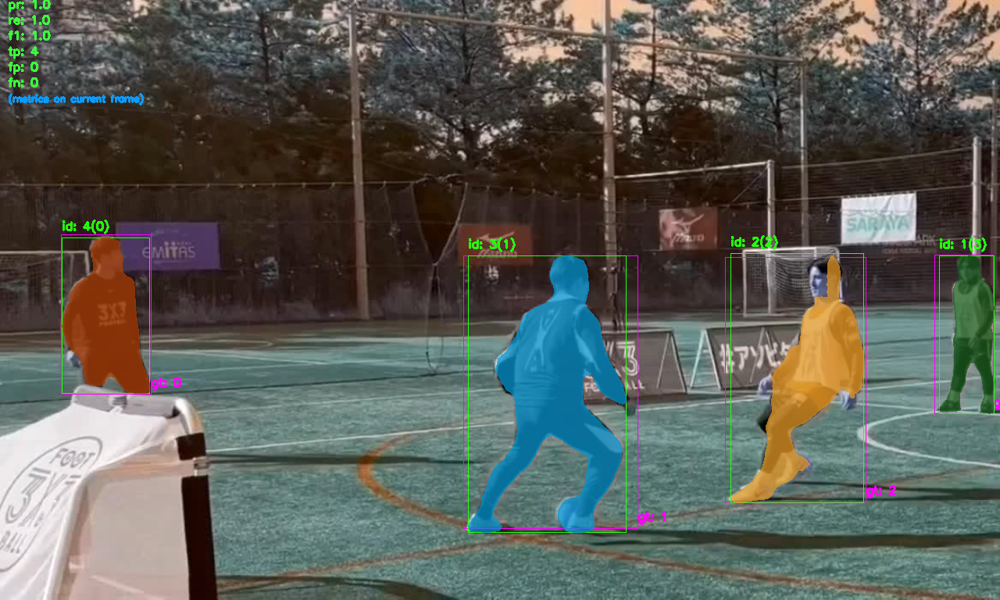


0: 384x640 4 persons, 23.4ms
Speed: 2.0ms preprocess, 23.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 81.05215999999999, 300.373248, 195.67104, 504.70425600000004], [1, 595.9776, 328.78963200000004, 819.1776, 677.557632], [2, 928.976, 329.962752, 1090.64128, 642.325248], [3, 1196.81088, 326.44224, 1269.8848, 529.5997440000001]]
PRED: [[1, 1200, 326, 1272, 528], [2, 932, 327, 1091, 641], [3, 597, 326, 812, 684], [4, 82, 302, 193, 504]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 4 persons, 26.9ms
Speed: 2.8ms preprocess, 26.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 83.71456, 300.13824, 198.32320000000004, 504.469248], [1, 598.40064, 329.96236799999997, 821.6006399999999, 678.730368], [2, 928.97536, 329.962752, 1072.54784, 642.325248], [3, 1196.81152, 326.44224, 1268.1536, 529.5997440000001]]
PRED: [[1, 1199, 326, 1271, 528], [2, 930, 337, 1076, 641], [3, 597, 322, 825, 690], [4, 86, 301, 193, 504]]
Class mappi

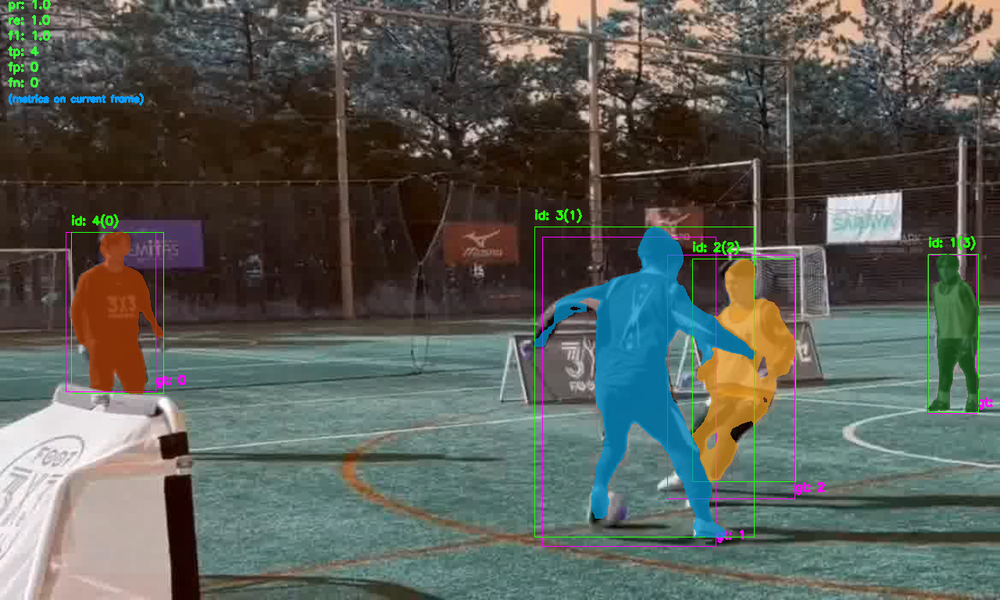


0: 384x640 4 persons, 23.8ms
Speed: 2.5ms preprocess, 23.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 83.05792, 296.917248, 197.66656, 501.24825599999997], [1, 705.6441599999999, 309.994752, 916.90944, 705.717504], [2, 887.95648, 324.04224, 1017.0956799999999, 636.4584960000001], [3, 1183.53984, 326.44224, 1246.23552, 529.5889920000001]]
PRED: [[1, 1184, 326, 1249, 527], [2, 916, 324, 1019, 527], [3, 717, 323, 984, 700], [4, 88, 297, 206, 503]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 4 persons, 21.2ms
Speed: 2.3ms preprocess, 21.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 81.32608000000002, 296.404992, 195.94495999999998, 500.736], [1, 722.52032, 329.962368, 965.1724800000001, 702.1866239999999], [2, 887.9558400000001, 324.04300800000004, 1026.73984, 644.683008], [3, 1178.41024, 326.73024000000004, 1246.54208, 529.8877440000001]]
PRED: [[1, 1181, 326, 1247, 527], [2, 886, 324, 1017, 648], [3, 718, 338, 972,

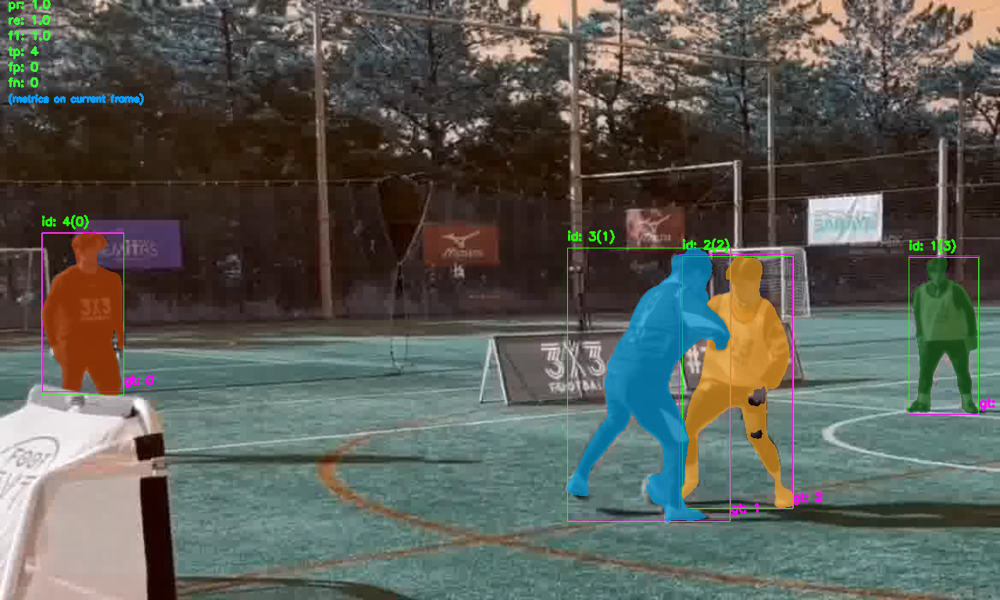


0: 384x640 4 persons, 21.9ms
Speed: 2.0ms preprocess, 21.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 48.53696, 299.13599999999997, 152.28480000000002, 503.467008], [1, 718.89344, 317.045376, 927.77024, 665.8133760000001], [2, 863.82464, 325.216128, 1003.8361599999998, 651.7336320000001], [3, 1163.03552, 327.615744, 1254.992, 530.773248]]
PRED: [[1, 1161, 331, 1251, 528], [2, 876, 328, 1001, 650], [3, 711, 321, 931, 666], [4, 52, 297, 157, 505]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 4 persons, 23.3ms
Speed: 1.9ms preprocess, 23.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 42.80512000000001, 301.19424, 146.55295999999998, 505.52524800000003], [1, 717.6979200000001, 315.871872, 917.70944, 664.639872], [2, 871.0144, 322.86912, 994.1811200000001, 649.375872], [3, 1163.03488, 327.615744, 1256.4928, 530.773248]]
PRED: [[1, 1158, 330, 1256, 530], [2, 864, 332, 990, 650], [3, 710, 315, 927, 667], [4, 45, 299, 153,

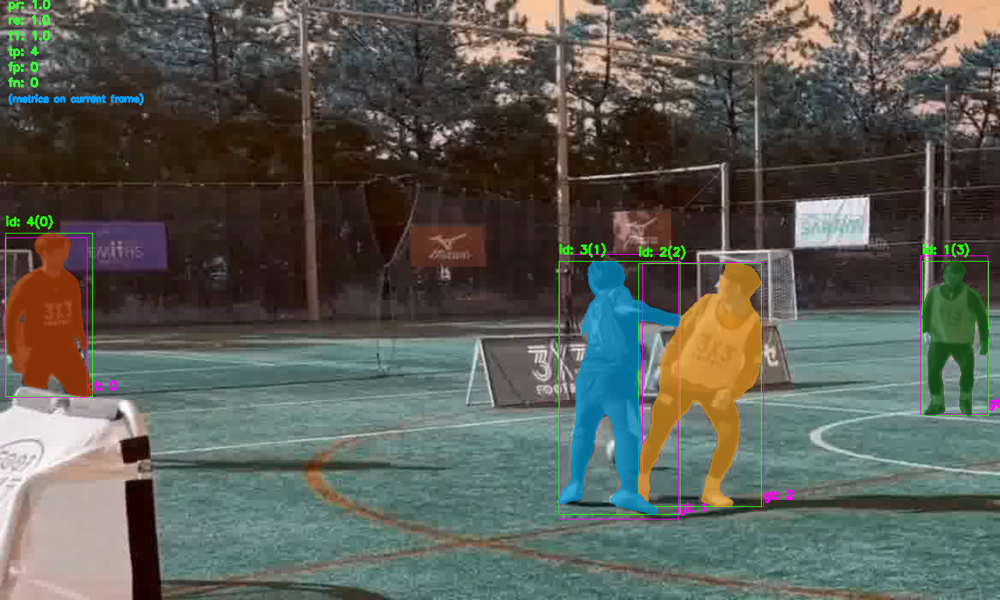


0: 384x640 4 persons, 21.8ms
Speed: 2.2ms preprocess, 21.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 6.388480000000003, 304.3092479999999, 112.88703999999998, 508.640256], [1, 709.25952, 335.7976319999999, 845.7203200000001, 650.560128], [2, 804.65728, 328.747008, 977.3152, 649.3870079999999], [3, 1178.7398400000002, 338.17612800000006, 1273.97312, 533.119872]]
PRED: [[1, 1177, 343, 1273, 532], [2, 803, 332, 979, 649], [3, 711, 339, 846, 650], [4, 3, 298, 115, 508]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 4 persons, 20.6ms
Speed: 2.3ms preprocess, 20.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 6.772480000000005, 304.49049599999995, 114.76096, 508.821504], [1, 710.5318399999999, 336.22425599999997, 846.9926399999999, 643.9895039999999], [2, 816.3833599999999, 327.604992, 983.12256, 648.2449919999999], [3, 1173.91744, 338.17612800000006, 1277.3696, 533.119872]]
PRED: [[1, 1173, 350, 1279, 534], [2, 812, 332,

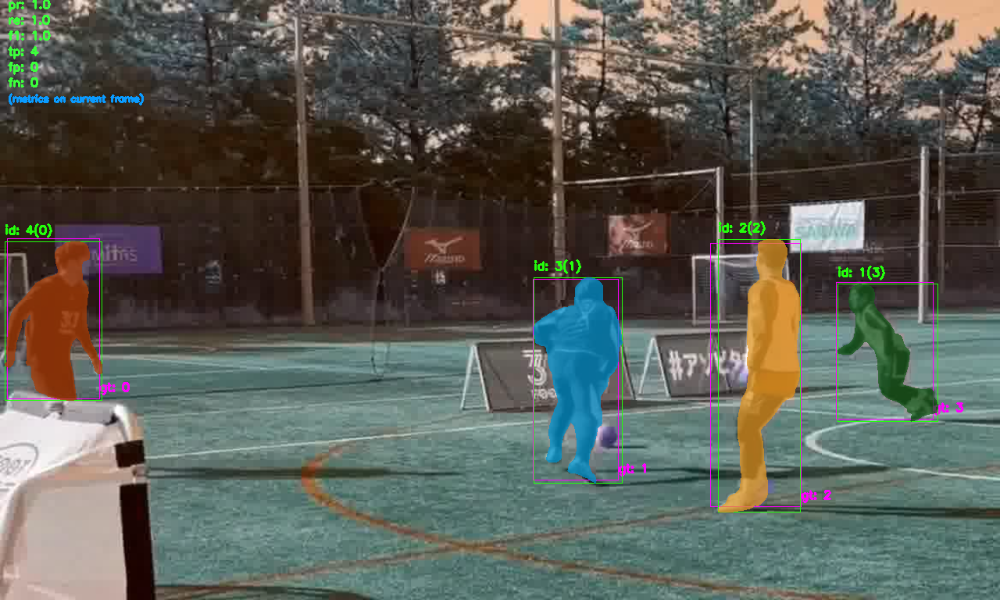


0: 384x640 4 persons, 21.1ms
Speed: 2.2ms preprocess, 21.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 15.046400000000002, 306.048, 129.58848, 510.379008], [1, 682.2028799999999, 357.20563200000004, 791.6710400000001, 608.6403839999999], [2, 909.2608, 304.53350400000005, 1033.86368, 648.24576], [3, 1059.0912, 361.728, 1182.80576, 536.426496]]
PRED: [[1, 1056, 362, 1184, 539], [2, 928, 305, 1036, 653], [3, 679, 353, 786, 602], [4, 6, 311, 133, 512]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 4 persons, 21.6ms
Speed: 2.2ms preprocess, 21.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 20.679680000000005, 306.31449599999996, 131.2768, 510.645504], [1, 682.2028799999999, 357.205632, 791.6710400000001, 602.880384], [2, 948.0985600000001, 309.46099200000003, 1072.70144, 653.1732480000001], [3, 1048.96512, 363.37075200000004, 1172.67968, 538.069248]]
PRED: [[1, 1049, 358, 1172, 542], [2, 958, 307, 1074, 656], [3, 680, 351

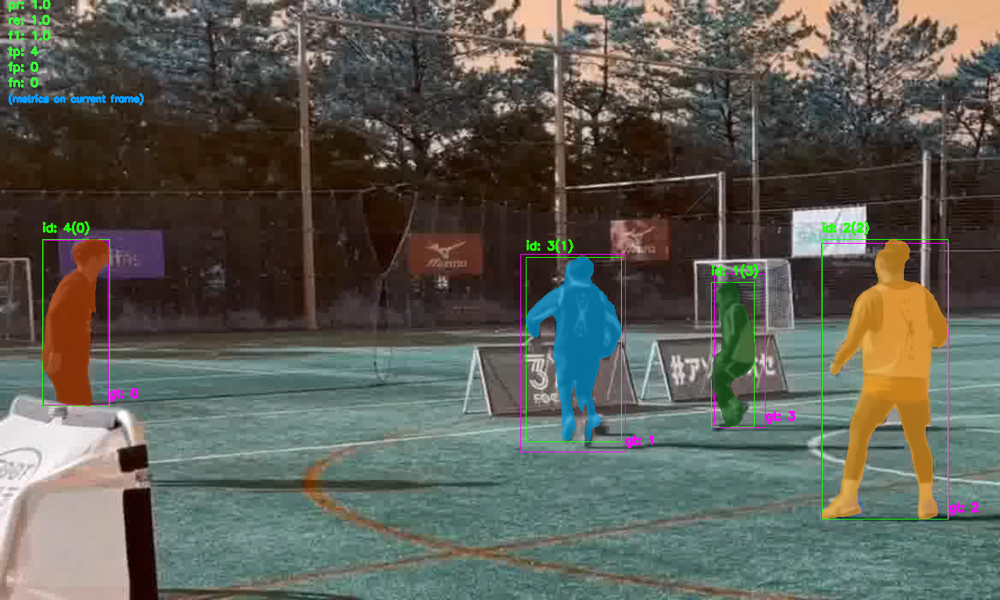


0: 384x640 4 persons, 20.2ms
Speed: 1.8ms preprocess, 20.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 59.397119999999994, 307.41350399999993, 138.02751999999998, 520.906752], [1, 651.8144000000001, 330.98688, 803.5072, 571.65888], [2, 1093.26016, 293.03424, 1233.15008, 668.0532479999999], [3, 876.93184, 363.306624, 942.8390400000001, 552.341376]]
PRED: [[1, 880, 373, 939, 552], [2, 1094, 301, 1234, 662], [3, 645, 336, 797, 568], [4, 58, 310, 141, 520]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 4 persons, 21.6ms
Speed: 1.9ms preprocess, 21.6ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 63.45215999999999, 307.413504, 138.02752, 523.2], [1, 658.56448, 332.224128, 804.7775999999999, 570.02688], [2, 1106.7616, 281.525376, 1246.65152, 661.440384], [3, 848.21952, 364.948992, 927.64992, 545.812992]]
PRED: [[1, 849, 376, 931, 552], [2, 1106, 290, 1244, 663], [3, 623, 338, 800, 564], [4, 61, 313, 143, 522]]
Class mapping:

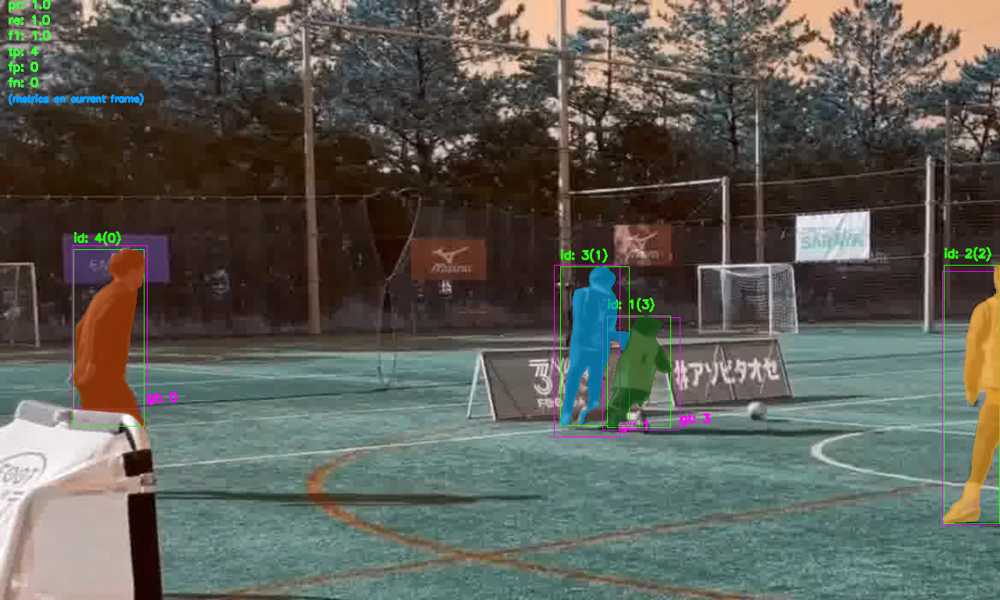


0: 384x640 4 persons, 22.0ms
Speed: 1.8ms preprocess, 22.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 95.95647999999998, 309.920256, 193.8304, 523.2], [1, 701.9513599999999, 339.98937600000005, 791.69344, 555.66912], [2, 1213.0406400000002, 360.31948800000004, 1280.0, 672.938496], [3, 774.9696, 408.319488, 874.5971199999999, 551.402496]]
PRED: [[1, 770, 403, 859, 549], [2, 1210, 380, 1279, 668], [3, 711, 341, 803, 544], [4, 99, 314, 189, 534]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 5 persons, 23.4ms
Speed: 1.8ms preprocess, 23.4ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 98.91583999999997, 305.812992, 198.90432, 523.2], [1, 693.91744, 340.79999999999995, 789.9942399999999, 551.967744], [2, 1245.15072, 403.09363199999996, 1280.0, 672.93888], [3, 778.68544, 409.63199999999995, 878.31296, 552.715008]]
PRED: [[1, 781, 403, 868, 557], [2, 1244, 571, 1279, 665], [3, 695, 347, 791, 547], [4, 101, 308, 195, 532]]
C

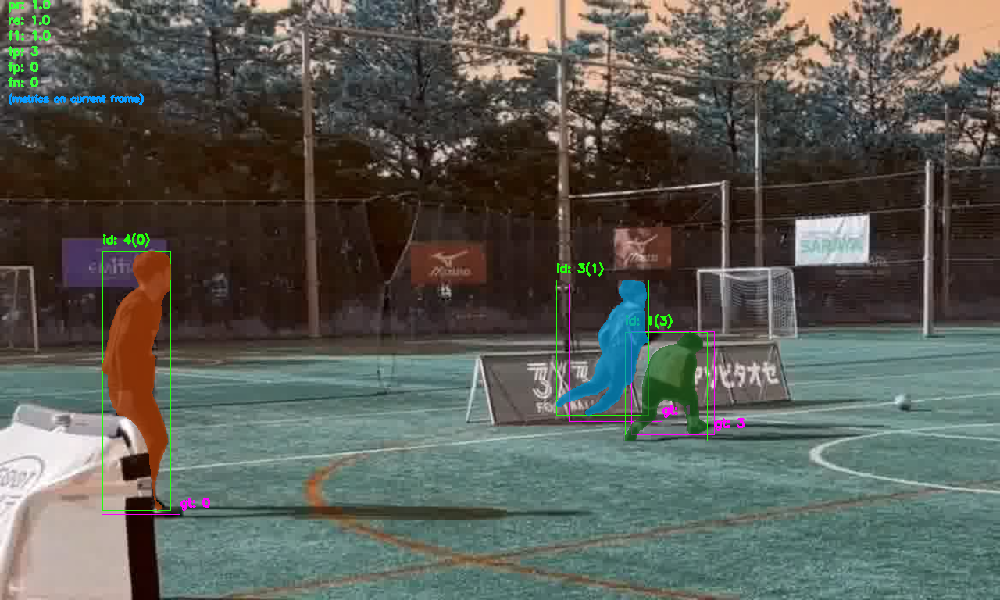


0: 384x640 3 persons, 21.3ms
Speed: 1.9ms preprocess, 21.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 136.05504, 321.824256, 225.97248000000002, 659.5630080000001], [1, 739.5065599999999, 365.439744, 859.1776, 535.573248], [3, 806.0377600000002, 427.32787199999996, 924.27392, 558.965376]]
PRED: [[1, 800, 428, 920, 564], [3, 747, 363, 866, 530], [4, 147, 319, 228, 655]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 3 persons, 22.5ms
Speed: 2.0ms preprocess, 22.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 141.9616, 320.78937600000006, 237.51232000000002, 660.384384], [1, 747.9456, 365.440128, 884.50496, 536.37312], [3, 811.9456, 424.864128, 943.6716799999999, 558.9653760000001]]
PRED: [[1, 799, 427, 932, 564], [3, 747, 365, 885, 529], [4, 153, 319, 235, 654]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 3 persons, 19.9ms
Speed: 1.9ms preprocess, 19.9ms inference, 1.9ms postprocess per image at shape (1, 3, 38

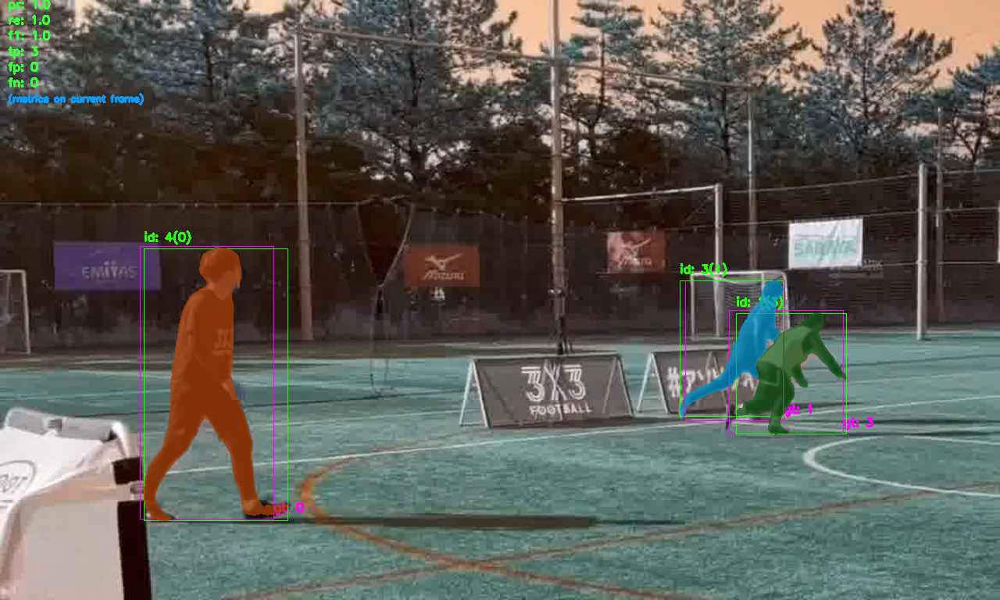


0: 384x640 2 persons, 24.6ms
Speed: 1.8ms preprocess, 24.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 184.17535999999998, 315.626496, 355.13472, 664.490496], [1, 917.4022400000001, 357.77088000000003, 1029.15008, 537.205632], [3, 962.51008, 394.51776, 1096.52608, 554.059008]]
PRED: [[1, 954, 400, 1088, 555], [3, 904, 361, 1017, 540], [4, 186, 319, 370, 667]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 3 persons, 20.4ms
Speed: 3.2ms preprocess, 20.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
GT: [[0, 188.39424000000002, 315.626496, 359.3536, 664.490496], [1, 957.3702400000001, 355.58438399999994, 1055.03552, 535.573632], [3, 991.78112, 391.22112, 1113.4246400000002, 552.426624]]
PRED: [[1, 974, 395, 1114, 554], [3, 980, 361, 1048, 518], [4, 192, 317, 370, 667]]
Class mapping: {1: 3, 2: 2, 3: 1, 4: 0}

0: 384x640 2 persons, 19.8ms
Speed: 2.1ms preprocess, 19.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 6

In [13]:
import cv2
from inference.interact.interactive_utils import image_to_torch, index_numpy_to_one_hot_torch, torch_prob_to_numpy_mask, overlay_davis
from pose_estimation import Yolov8PoseModel
from tracker import Tracker
from metrics.metrics_utils import yolo_bboxes_from_txt, calculate_iou, update_gt_pred_mapping_dict, calculate_tp_fp_fn, metrics_calculation
import glob
from statistics import mean

torch.cuda.empty_cache()
torch.set_grad_enabled(False)

yolov8pose_model = Yolov8PoseModel(DEVICE, PERSON_CONF, KPTS_CONF)
tracker = Tracker(XMEM_CONFIG, MAX_OBJECT_CNT, DEVICE)

for video_dir in os.listdir(TEST_DIR):
    yolo_files = sorted(glob.glob(f'{TEST_DIR}/{video_dir}/obj_train_data/*.txt'))
    image_files = sorted([file for file in os.listdir(f'{TEST_DIR}/{video_dir}/obj_train_data') if file.endswith(('.png', '.jpg', '.jpeg', '.PNG', '.JPG', '.JPEG'))])

    print(video_dir)

    yolov8pose_model =  Yolov8PoseModel(DEVICE, PERSON_CONF, KPTS_CONF)
    tracker = Tracker(XMEM_CONFIG, MAX_OBJECT_CNT, DEVICE)
    persons_in_video = False

    class_color_mapping = generate_colors_dict(MAX_OBJECT_CNT+1)

    current_frame_index = -1

    mapping_dict = {}
    class_label_mapping = {}

    with torch.cuda.amp.autocast(enabled=True):

        for i, frame_yolo in enumerate(yolo_files):
            current_frame_index += 1

            frame = cv2.imread(os.path.join(f'{TEST_DIR}/{video_dir}/obj_train_data',image_files[i]))

            frame = cv2.resize(frame, INFERENCE_SIZE, interpolation = cv2.INTER_AREA)

            gt_bboxes_with_idx = yolo_bboxes_from_txt(frame_yolo, INFERENCE_SIZE[0], INFERENCE_SIZE[1])
            gt_bboxes_without_idx = torch.tensor([box[1:] for box in gt_bboxes_with_idx])

            yolo_filtered_bboxes = yolov8pose_model.get_filtered_bboxes_by_confidence(frame)

            if len(yolo_filtered_bboxes) > 0:
                persons_in_video = True
            else:
                masks = []
                continue

            if persons_in_video:
                if len(class_label_mapping) == 0: # First persons in video
                    mask = tracker.create_mask_from_img(frame, yolo_filtered_bboxes, device='0')
                    unique_labels = np.unique(mask)
                    class_label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
                    mask = np.array([class_label_mapping[label] for label in mask.flat]).reshape(mask.shape)
                    prediction = tracker.add_mask(frame, mask)
                elif len(filtered_bboxes) > 0:  # Additional/new persons in video
                    mask = tracker.create_mask_from_img(frame, filtered_bboxes, device='0')
                    unique_labels = np.unique(mask)
                    mask_image = Image.fromarray(mask, mode='L')
                    class_label_mapping = add_new_classes_to_dict(unique_labels, class_label_mapping)
                    mask = np.array([class_label_mapping[label] for label in mask.flat]).reshape(mask.shape)
                    merged_mask = merge_masks(masks.squeeze(0), torch.tensor(mask))
                    prediction = tracker.add_mask(frame,merged_mask.squeeze(0).numpy())
                    filtered_bboxes = []
                else: # Only predict
                    prediction = tracker.predict(frame)

                masks = torch.tensor(torch_prob_to_numpy_mask(prediction)).unsqueeze(0)
                masks = tracker.keep_largest_connected_components(masks)
                mask_bboxes_with_idx = tracker.masks_to_boxes_with_ids(masks)

                # dict which mathes gt_classes and model_classes
                mapping_dict = update_gt_pred_mapping_dict(mapping_dict, gt_bboxes_with_idx, mask_bboxes_with_idx)

                if PRINT_LOGS:
                    print(f'GT: {gt_bboxes_with_idx}')
                    print(f'PRED: {mask_bboxes_with_idx}')
                    print(f'Class mapping: {mapping_dict}')

                filtered_bboxes = get_iou_filtered_yolo_mask_bboxes(yolo_filtered_bboxes, mask_bboxes_with_idx, 0.1)

                # VISUALIZATION
                for boxj in gt_bboxes_with_idx:
                    id = boxj[0]
                    boxj = boxj[1:]
                    cv2.rectangle(frame, (int(boxj[0]), int(boxj[1])), (int(boxj[2]), int(boxj[3])), (255,0,255), 1)
                    cv2.putText(frame, f'gt: {id}', (int(boxj[2]), int(boxj[3])-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,255), 2)
                for box_line in mask_bboxes_with_idx:
                    id_box = [int(value) for value in box_line]
                    id = int(id_box[0])
                    box = id_box[1:5]
                    cv2.rectangle(frame, (box[0], box[1]), (box[2], box[3]), (36,255,12), 1)
                    mapid = mapping_dict[id]
                    cv2.putText(frame, f'id: {id}({mapid})', (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36,255,12), 2)

                # Metrics calculation
            tp, fp, fn = calculate_tp_fp_fn(gt_bboxes_with_idx, mask_bboxes_with_idx, mapping_dict, iou_threshold=0.5)
            precision, recall, f1_score = metrics_calculation(tp, fp, fn)

            precision_arr.append(precision)
            recall_arr.append(recall)
            f1_score_arr.append(f1_score)

            cv2.putText(frame, f'pr: {precision}', (10, 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (60,255,60), 2)
            cv2.putText(frame, f're: {recall}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (60,255,60), 2)
            cv2.putText(frame, f'f1: {f1_score}', (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (60,255,60), 2)

            cv2.putText(frame, f'tp: {tp}', (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (60,255,60), 2)
            cv2.putText(frame, f'fp: {fp}', (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (60,255,60), 2)
            cv2.putText(frame, f'fn: {fn}', (10, 110), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (60,255,60), 2)
            cv2.putText(frame, '(metrics on current frame)', (10, 130), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (10,155,255), 2)


            visualization = overlay_mask_on_image(frame, masks, class_color_mapping, alpha=0.75)
            visualization = cv2.cvtColor(visualization, cv2.COLOR_BGR2RGB)

            if current_frame_index % SHOW_EVERY == 0:
                display(Image.fromarray(visualization))



Let see on our metrics on video(s):

In [14]:
print(f'FINAL PRECICION: {mean(precision_arr)}')
print(f'FINAL RECALL: {mean(recall_arr)}')
print(f'FINAL F1 SCORE: {mean(f1_score_arr)}')

FINAL PRECICION: 0.9829059829059829
FINAL RECALL: 0.9893162393162394
FINAL F1 SCORE: 0.9856532356532357


Or you can easily run the command:

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!python metrics_counting.py --labels_dir=test_files --width=1280 \
--height=768  --device=0 --person_conf=0.8 --kpts_conf=0.8\
--iou_thresh=0.1 --print_every=1

/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_5m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_11m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/mobile_sam/modeling/tiny_vit_sam.py:656: UserWarning: Overwriting tiny_vit_21m_224 in registry with mobile_sam.modeling.tiny_vit_sam.tiny_vit_21m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_